#Entrenamiento del modelo
En este script se realiza el entrenmaiento del modelo utilizando YoloV4 como modelo, utilizando sus pesos preentrenados y trasnfer learning para el entrenamiento.

In [ ]:
import numpy as np
import cv2
import pandas as pd
import operator
import matplotlib.pyplot as plt
import os
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import Sequence

In [ ]:
# Descomentar para instalar
#!pip install tensorflow
#!pip install tensorboard

In [ ]:
!wget https://github.com/AlexeyAB/darknet/releases/download/darknet_yolo_v3_optimal/yolov4.weights -P "/content/drive/MyDrive/Proyecto_FD/YoloWeight"

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
%cd "/content/gdrive/MyDrive/Proyecto_FD"

/content/gdrive/MyDrive/Proyecto_FD


In [ ]:
%cd /content/gdrive/MyDrive/Proyecto_FD/yolo-v4-tf.keras

/content/gdrive/MyDrive/Proyecto_FD/yolo-v4-tf.keras


In [ ]:
import cv2  # OpenCV for image processing
import numpy as np
from models import Yolov4
model = Yolov4(weight_path='/content/gdrive/MyDrive/Proyecto_FD/YoloWeight/yolov4.weights',
               class_name_path='/content/gdrive/MyDrive/Proyecto_FD/yolo-v4-tf.keras/class_names/coco_classes.txt')

nms iou: 0.413 score: 0.3
all weights read
load from /content/gdrive/MyDrive/Proyecto_FD/YoloWeight/yolov4.weights


img shape:  (300, 300, 3)
1/1 [==============================] - 6s 6s/step
# of bboxes: 3


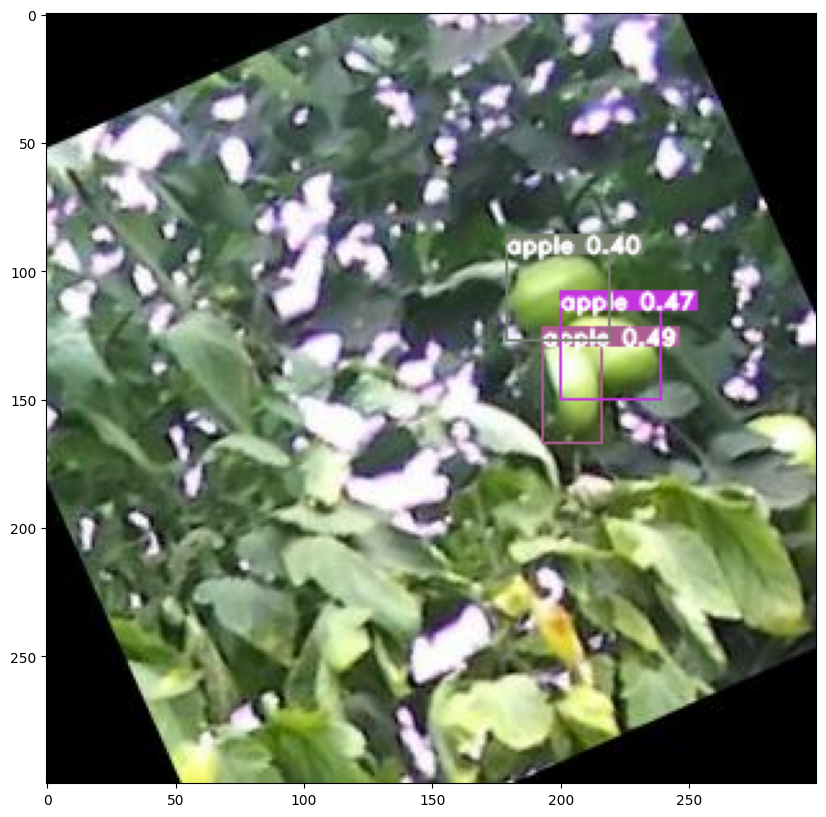

In [ ]:
pred = model.predict('/content/gdrive/MyDrive/Proyecto_FD/explo_img/anglerandom_tomate_barroselas_20200806_0011_05.jpg')

In [ ]:
!pwd

/content/gdrive/MyDrive/Proyecto_FD/yolo-v4-tf.keras


In [ ]:
!cd /content/gdrive/MyDrive/Proyecto_FD/

In [ ]:
from utils import read_annotation_lines
from sklearn.model_selection import train_test_split

# Leer las líneas de anotación
annotation_file = '/content/gdrive/MyDrive/Proyecto_FD/Annotations.txt'
all_lines = read_annotation_lines(annotation_file)

# Dividir los datos en entrenamiento, validación y prueba
train_lines, val_lines = train_test_split(all_lines, test_size=0.15, random_state=42)

In [ ]:
print(len(train_lines))

255


In [ ]:
print(len(val_lines))

45


In [ ]:
from utils import DataGenerator

folder_path = '/content/gdrive/MyDrive/Proyecto_FD/explo_img'
class_name_path = '/content/gdrive/MyDrive/Proyecto_FD/Clases.txt'

data_gen_train = DataGenerator(train_lines, class_name_path, folder_path)
data_gen_val = DataGenerator(val_lines, class_name_path, folder_path)

In [ ]:
import os
folder_path = folder_path
num_archives = len([f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))])
print(num_archives)

300


In [ ]:
class_name_path = '/content/gdrive/MyDrive/Proyecto_FD/Clases.txt'

model = Yolov4(weight_path=None,
               class_name_path=class_name_path)

nms iou: 0.413 score: 0.3


In [ ]:
# defining pathes and callbacks
import tensorflow.keras as keras # Import the keras module

dir4saving = '/content/gdrive/MyDrive/Proyecto_FD/.ipynb_checkpoints'
os.makedirs(dir4saving, exist_ok = True)

logdir = '/content/gdrive/MyDrive/Proyecto_FD/yolo-v4-tf.keras/logs'
os.makedirs(logdir, exist_ok = True)

name4saving = 'epoch_{epoch:02d}-val_loss-{val_loss:.4f}.hdf5'

filepath = os.path.join(dir4saving, name4saving)

rLrCallBack = keras.callbacks.ReduceLROnPlateau(monitor = 'val_loss',
                                             factor = 0.1,
                                             patience = 5,
                                             verbose = 1)

tbCallBack = keras.callbacks.TensorBoard(log_dir = logdir,
                                         histogram_freq = 0,
                                         write_graph = False,
                                         write_images = False)

mcCallBack_loss = keras.callbacks.ModelCheckpoint(filepath,
                                            monitor = 'val_loss',
                                            verbose = 1,
                                            save_best_only = True,
                                            save_weights_only = False,
                                            mode = 'auto',
                                            period = 1)

esCallBack = keras.callbacks.EarlyStopping(monitor = 'val_loss',
                                          mode = 'min',
                                          verbose = 1,
                                          patience = 10)

In [ ]:
model.fit(data_gen_train,
          initial_epoch=0,
          epochs=100,
          val_data_gen=data_gen_val,
          callbacks=[rLrCallBack,
                     tbCallBack,
                     mcCallBack_loss,
                     esCallBack]
         )

Epoch 1/100
32/32 [==============================] - ETA: 0s - loss: 71642.7656
Epoch 1: val_loss improved from inf to 113897.71094, saving model to /content/gdrive/MyDrive/Proyecto_FD/.ipynb_checkpoints/epoch_01-val_loss-113897.7109.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


32/32 [==============================] - 109s 1s/step - loss: 71642.7656 - val_loss: 113897.7109 - lr: 1.0000e-04
Epoch 2/100
32/32 [==============================] - ETA: 0s - loss: 36692.6328
Epoch 2: val_loss improved from 113897.71094 to 100822.58594, saving model to /content/gdrive/MyDrive/Proyecto_FD/.ipynb_checkpoints/epoch_02-val_loss-100822.5859.hdf5
32/32 [==============================] - 24s 756ms/step - loss: 36692.6328 - val_loss: 100822.5859 - lr: 1.0000e-04
Epoch 3/100
32/32 [==============================] - ETA: 0s - loss: 23275.1914
Epoch 3: val_loss improved from 100822.58594 to 84553.71094, saving model to /content/gdrive/MyDrive/Proyecto_FD/.ipynb_checkpoints/epoch_03-val_loss-84553.7109.hdf5
32/32 [==============================] - 25s 740ms/step - loss: 23275.1914 - val_loss: 84553.7109 - lr: 1.0000e-04
Epoch 4/100
32/32 [==============================] - ETA: 0s - loss: 15522.9150
Epoch 4: val_loss improved from 84553.71094 to 68914.69531, saving model to /cont

In [ ]:
import tensorboard

#Visualize on tensorboard (move this above)
%reload_ext tensorboard
%tensorboard --logdir /content/gdrive/MyDrive/Proyecto_FD/yolo-v4-tf.keras/logs


Output hidden; open in https://colab.research.google.com to view.

img shape:  (300, 300, 3)
1/1 [==============================] - 2s 2s/step
# of bboxes: 1


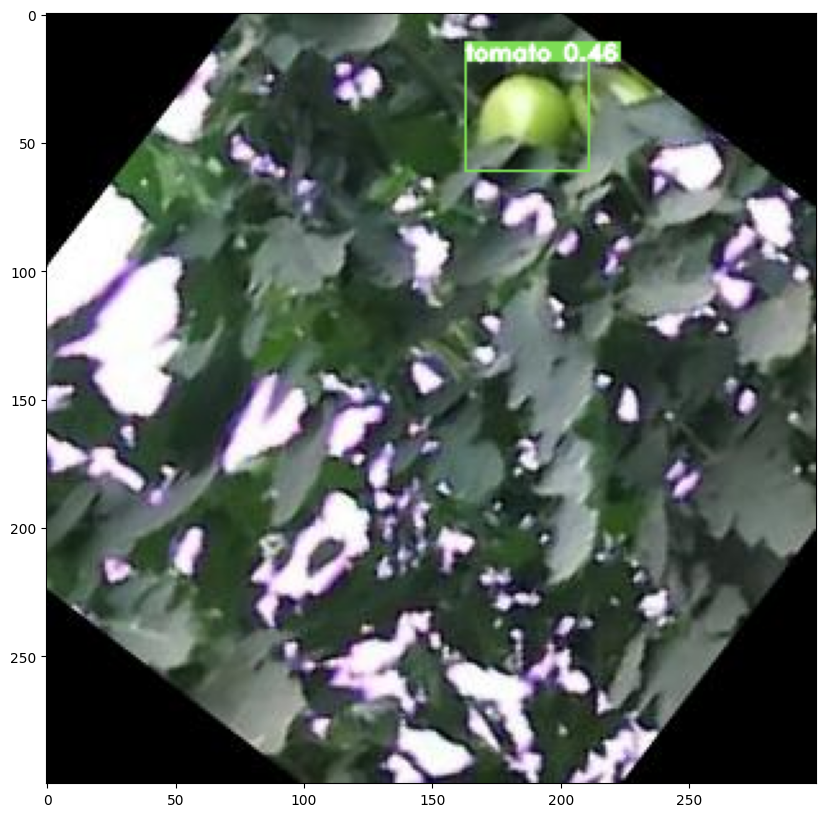

,x1,y1,x2,y2,class_name,score,w,h
0,163,18,211,61,tomato,0.460136,48,43


In [ ]:
pred = model.predict('/content/gdrive/MyDrive/Proyecto_FD/explo_img/anglerandom_tomate_barroselas_20200806_0014_02.jpg')
pred

img shape:  (300, 300, 3)
1/1 [==============================] - 0s 58ms/step
# of bboxes: 5


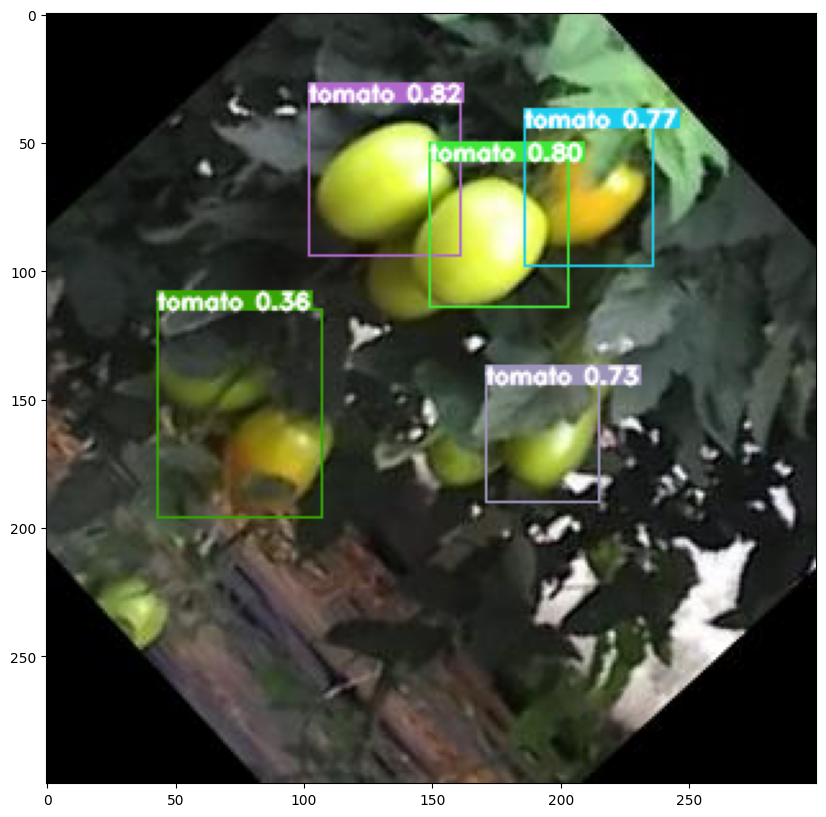

,x1,y1,x2,y2,class_name,score,w,h
0,102,34,161,94,tomato,0.816947,59,60
1,149,57,203,114,tomato,0.800127,54,57
2,186,44,236,98,tomato,0.770598,50,54
3,171,144,215,190,tomato,0.729754,44,46
4,43,115,107,196,tomato,0.355012,64,81


In [ ]:
pred = model.predict('/content/gdrive/MyDrive/Proyecto_FD/test_img/anglerandom_tomate_barroselas_20200806_0043_14.jpg')
pred

img shape:  (300, 300, 3)
1/1 [==============================] - 0s 70ms/step
# of bboxes: 0


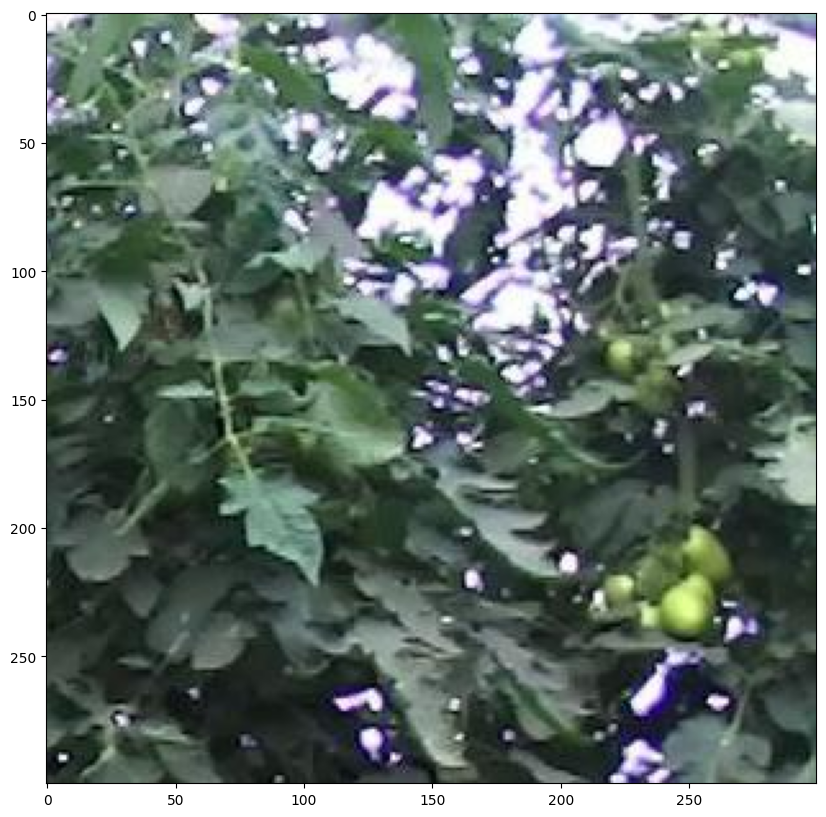

,x1,y1,x2,y2,class_name,score,w,h


In [ ]:
pred = model.predict('/content/gdrive/MyDrive/Proyecto_FD/test_img/flip_tomate_barroselas_20200806_0011_00.jpg')
pred

img shape:  (300, 300, 3)
1/1 [==============================] - 0s 71ms/step
# of bboxes: 0


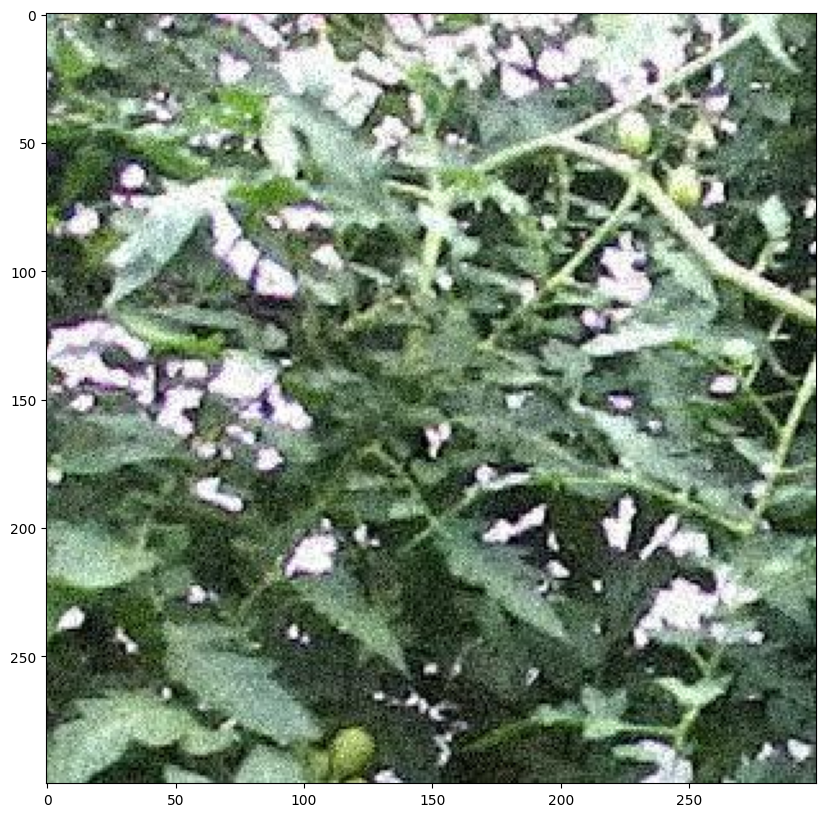

,x1,y1,x2,y2,class_name,score,w,h


In [ ]:
pred = model.predict('/content/gdrive/MyDrive/Proyecto_FD/test_img/noiserandom_tomate_barroselas_20200806_0127_01.jpg')
pred

img shape:  (300, 300, 3)
1/1 [==============================] - 0s 71ms/step
# of bboxes: 4


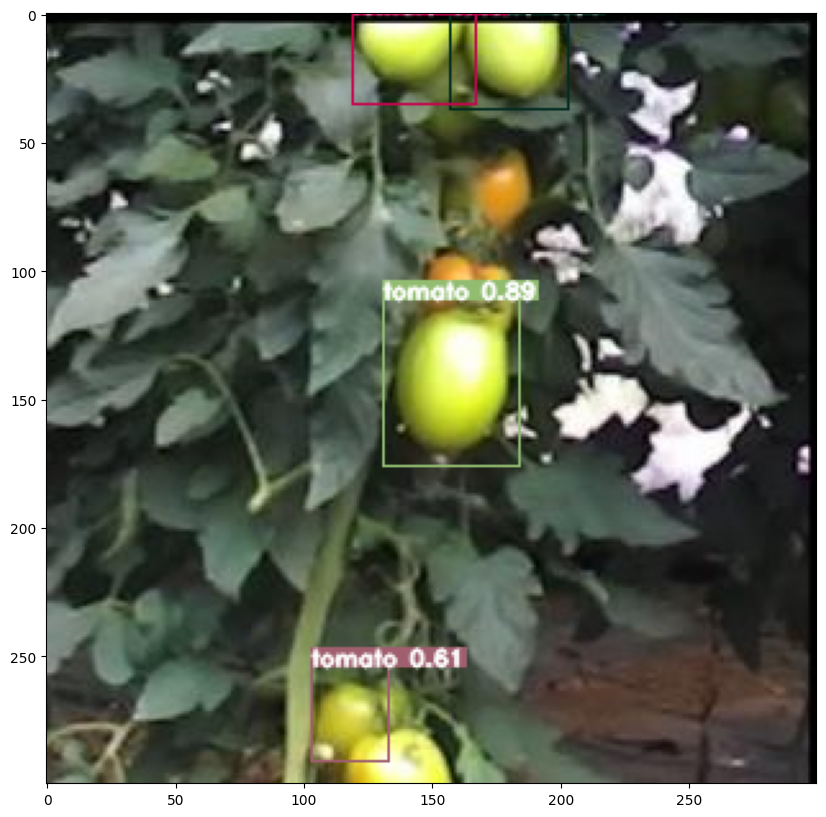

,x1,y1,x2,y2,class_name,score,w,h
0,131,111,184,176,tomato,0.890946,53,65
1,157,0,203,37,tomato,0.812283,46,37
2,103,254,133,291,tomato,0.606840,30,37
3,119,0,167,35,tomato,0.494844,48,35


In [ ]:
pred = model.predict('/content/gdrive/MyDrive/Proyecto_FD/test_img/translaterandom_tomate_barroselas_20200806_0072_13.jpg')
pred

img shape:  (3456, 4608, 3)
1/1 [==============================] - 0s 72ms/step
# of bboxes: 1


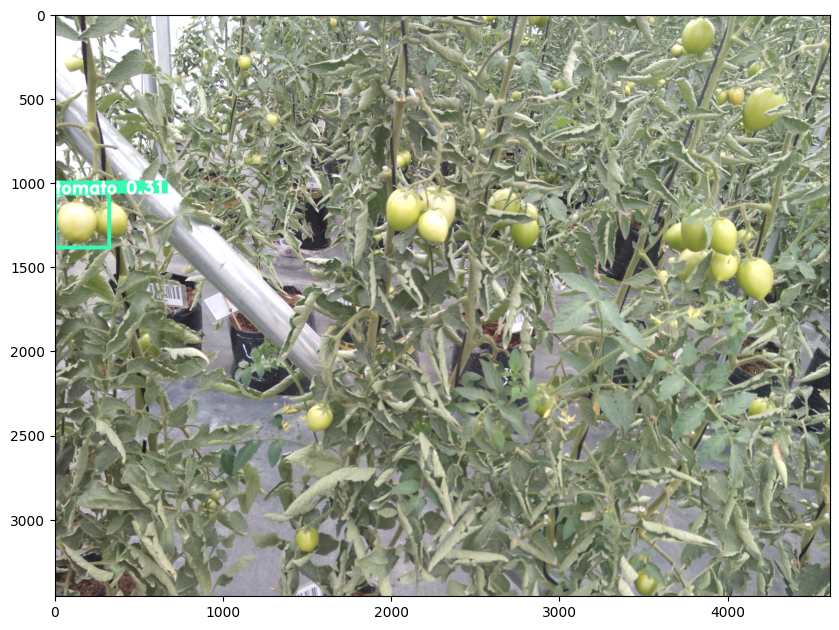

,x1,y1,x2,y2,class_name,score,w,h
0,0,1065,322,1386,tomato,0.306269,322,321


In [ ]:
pred = model.predict('/content/gdrive/MyDrive/Proyecto_FD/images/19_2024-03-01 10_30_14_RGB.JPG')
pred

img shape:  (3456, 4608, 3)
1/1 [==============================] - 0s 70ms/step
# of bboxes: 0


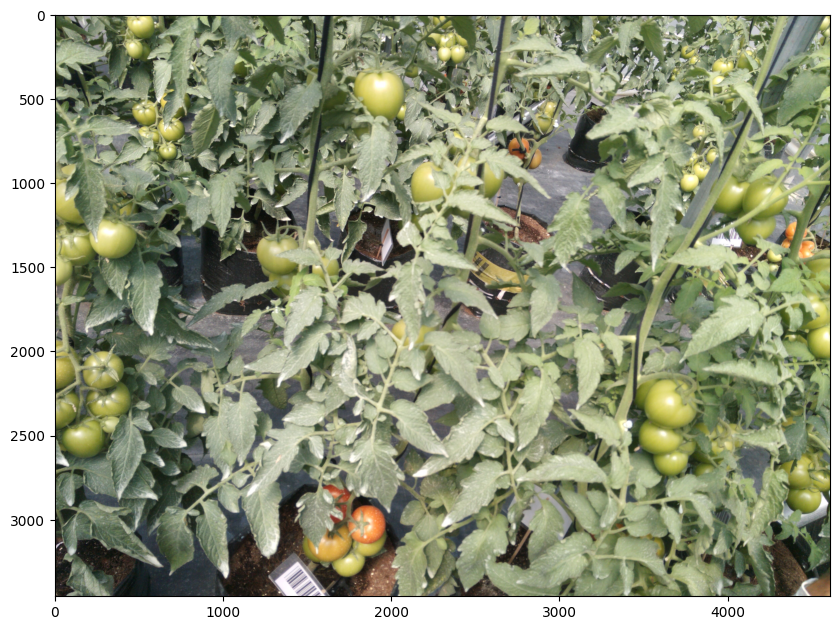

,x1,y1,x2,y2,class_name,score,w,h


In [ ]:
pred = model.predict('/content/gdrive/MyDrive/Proyecto_FD/images/57_2024-01-18 11_06_58_RGB.JPG')
pred

In [ ]:
annotation_path='/content/gdrive/MyDrive/Proyecto_FD/Annotations_test.txt'
gt_folder_path= '/content/gdrive/MyDrive/Proyecto_FD/yolo-v4-tf.keras/eval/ground_truth'
model.export_gt(annotation_path, gt_folder_path)

In [ ]:
# Función para cargar el modelo y realizar predicciones en una imagen
def predecir_imagen(modelo, ruta_imagen):
    # Leer la imagen
    predicciones = modelo.predict(ruta_imagen)
    # Verificar el número de columnas de las predicciones
    return predicciones

# Función para generar archivos de texto con las predicciones
def generar_archivos_prediccion(modelo, carpeta_imagenes, output_folder):
    for nombre_imagen in os.listdir(carpeta_imagenes):
        ruta_imagen = os.path.join(carpeta_imagenes, nombre_imagen)
        # Realizar predicciones en la imagen
        predicciones = predecir_imagen(modelo, ruta_imagen)
        # Crear una lista de cadenas de texto formateadas para todas las predicciones en la imagen
        predicciones_formateadas = []
        for fila in predicciones.itertuples():
            predicciones_formateadas.append(f"{fila[5]} {fila[6]} {fila[1]} {fila[2]} {fila[3]} {fila[4]}\n")
        # Obtener el nombre del archivo de salida
        nombre_archivo_salida = nombre_imagen.split('.')[0] + '.txt'
        # Guardar todas las predicciones formateadas en un archivo de texto en la carpeta de salida
        with open(os.path.join(output_folder, nombre_archivo_salida), 'w') as file:
            file.writelines(predicciones_formateadas)

# Ejemplo de uso:
# Supongamos que tienes un DataFrame de predicciones y una carpeta de imágenes de entrada y una carpeta de salida
# Rutas de las carpetas
carpeta_imagenes = '/content/gdrive/MyDrive/Proyecto_FD/test_img'
output_folder = '/content/gdrive/MyDrive/Proyecto_FD/yolo-v4-tf.keras/eval/pred_result'

# Llama a la función para generar y guardar los archivos de predicción
generar_archivos_prediccion(model, carpeta_imagenes, output_folder)

Output hidden; open in https://colab.research.google.com to view.

['tomato'] {'tomato': 58}
fp  20
tp  36
recall  36
prec  36
57.85% = tomato AP 


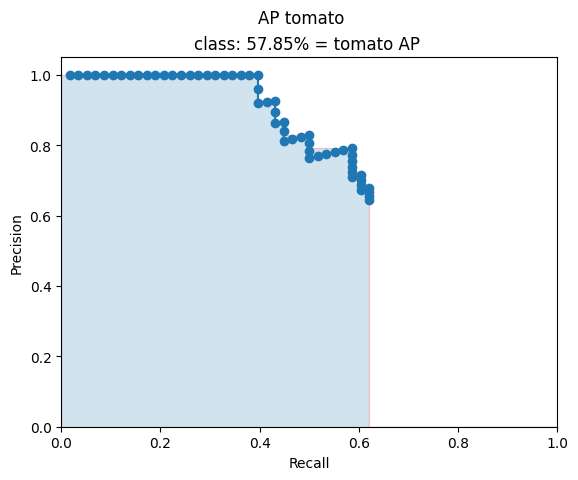

mAP = 57.85%
[('tomato', 58)]


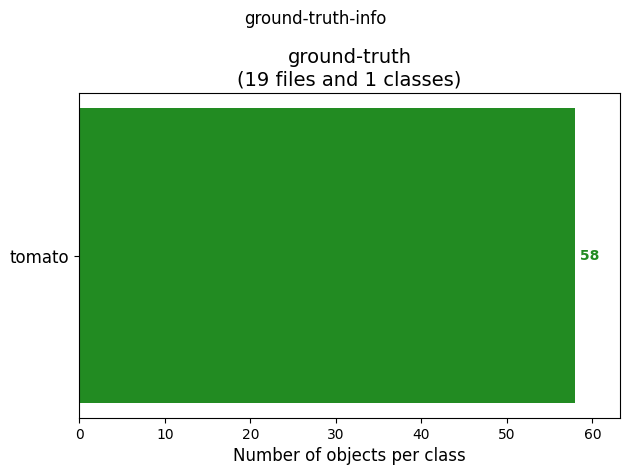

[('tomato', 56)]


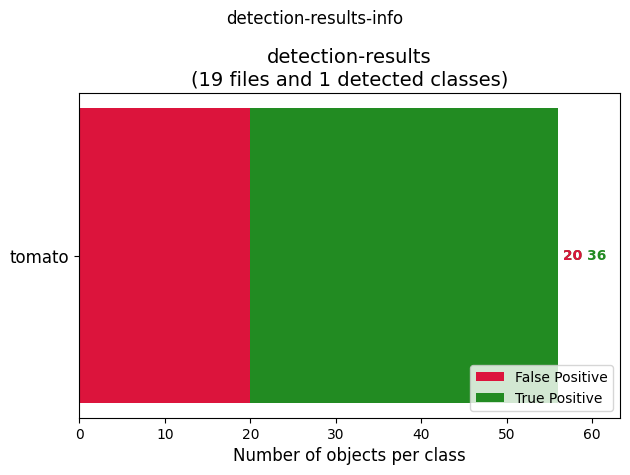

[('tomato', 0.5784698650625933)]


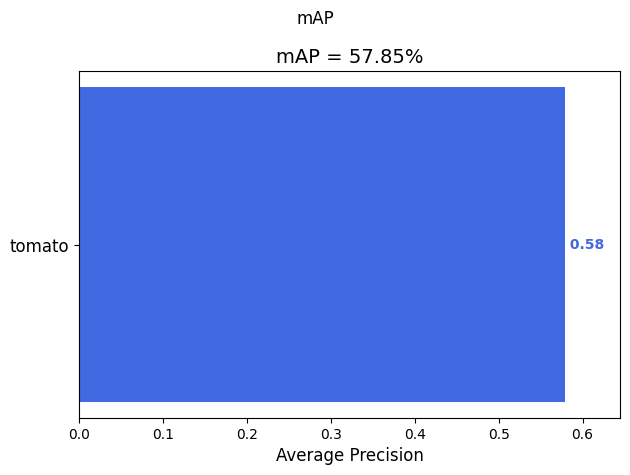

In [ ]:
gt_folder_path= '/content/gdrive/MyDrive/Proyecto_FD/yolo-v4-tf.keras/eval/ground_truth'
pred_folder_path ='/content/gdrive/MyDrive/Proyecto_FD/yolo-v4-tf.keras/eval/pred_result'
temp_json_folder_path= '/content/gdrive/MyDrive/Proyecto_FD/yolo-v4-tf.keras/eval/json'
output_files_path= '/content/gdrive/MyDrive/Proyecto_FD/yolo-v4-tf.keras/eval/result'


model.eval_map(gt_folder_path, pred_folder_path, temp_json_folder_path, output_files_path)